<a href="https://colab.research.google.com/github/hiimjupter/COS40007/blob/main/Portfolio4_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import random
import shutil

from sklearn.metrics import accuracy_score

import torch
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision.datasets import ImageFolder
from torchvision import datasets, models, transforms
from torchvision.utils import draw_bounding_boxes, save_image

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageFont, ImageDraw
import torchvision.transforms.functional as F

from tqdm import tqdm

In [ ]:
HOME_DIR = '/content/drive/MyDrive/COS40007/Portfolio4'
DATA_DIR = os.path.join(HOME_DIR, 'Dataset')
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
TRAIN_RUST = os.path.join(TRAIN_DIR, 'rust')
TRAIN_NO_RUST = os.path.join(TRAIN_DIR, 'no_rust')

TEST_DIR = os.path.join(DATA_DIR, 'test')

os.makedirs(TEST_DIR, exist_ok=True)
os.makedirs(f'{TEST_DIR}/no_rust', exist_ok=True)
os.makedirs(f'{TEST_DIR}/rust', exist_ok=True)

In [ ]:
# Function to randomly select images for the test set
def select_images(src_folder, dest_folder, max_images=10):
    # Ensure destination directory exists
    os.makedirs(dest_folder, exist_ok=True)

    # Get current number of images in destination
    current_count = len(os.listdir(dest_folder))

    if current_count >= max_images:
        print(f"'{dest_folder}' already has {current_count} images. Skipping.")
        return

    # Calculate how many images to add
    to_add = max_images - current_count
    src_images = os.listdir(src_folder)

    if not src_images:
        print(f"No images found in '{src_folder}'.")
        return

    # Select images to move
    selected = random.sample(src_images, min(to_add, len(src_images)))

    for image in selected:
        shutil.move(os.path.join(src_folder, image), os.path.join(dest_folder, image))
        print(f"Moved '{image}' to '{dest_folder}'.")

    print(f"'{dest_folder}' now has {len(os.listdir(dest_folder))} images.\n")

# Move 10 images from each category to the test set
select_images(TRAIN_NO_RUST, f'{TEST_DIR}/no_rust', max_images=10)
select_images(TRAIN_RUST, f'{TEST_DIR}/rust', max_images=10)

'/content/drive/MyDrive/COS40007/Portfolio4/Dataset/test/no_rust' already has 10 images. Skipping.
'/content/drive/MyDrive/COS40007/Portfolio4/Dataset/test/rust' already has 10 images. Skipping.


In [ ]:
def make_loader(train_data, batch_size, validation_split=0.2):
    # number of samples in train and test set
    train_len = int(len(train_data) * (1 - validation_split))
    val_len = len(train_data) - train_len
    train_set, val_set = torch.utils.data.random_split(train_data, [train_len, val_len])
    # create train_loader
    train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, shuffle=True,)
    # create test_loader
    val_loader = torch.utils.data.DataLoader(val_set, batch_size=1, shuffle=False,)
    return train_loader, val_loader

In [ ]:
# Load and check dataset labels
dataset = ImageFolder(TRAIN_DIR)
print(f"Classes: {dataset.classes}")
print(f"Class to Index: {dataset.class_to_idx}")
print(f"Number of images: {len(dataset)}")

# Check labels
labels = [label for _, label in dataset]
print(f"Unique labels: {set(labels)}")

Classes: ['no_rust', 'rust']
Class to Index: {'no_rust': 0, 'rust': 1}
Number of images: 235
Unique labels: {0, 1}


In [ ]:
# Data Augmentation
train_transformer = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.RandomRotation(20),  # Rotate randomly up to 20 degrees
    transforms.RandomHorizontalFlip(),  # Randomly flip horizontally
    transforms.RandomVerticalFlip(),  # Randomly flip vertically
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Adjust brightness and contrast
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),  # Translate randomly by a fraction of the image size
    transforms.ToTensor()
])

test_transformer = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor()
])

In [ ]:
# Load train & test data
train_data = datasets.ImageFolder(TRAIN_DIR, transform=train_transformer)
test_data = datasets.ImageFolder(TEST_DIR, transform=test_transformer)

# 64 samples per batch to load
BATCH_SIZE = 64

# Prepare data loaders
train_loader, val_loader = make_loader(train_data, batch_size=BATCH_SIZE, validation_split=0.2)
test_loader = DataLoader(test_data, batch_size=4, shuffle=False)

# Verify the classes and label indices
print(f"Training set size: {len(train_loader.dataset)}")
print(f"Validation set size: {len(val_loader.dataset)}")
print(f"Test set size: {len(test_loader.dataset)}")
print(f"Classes in training set: {train_data.classes}")
print(f"Classes in test set: {test_data.classes}")

Training set size: 188
Validation set size: 47
Test set size: 20
Classes in training set: ['no_rust', 'rust']
Classes in test set: ['no_rust', 'rust']


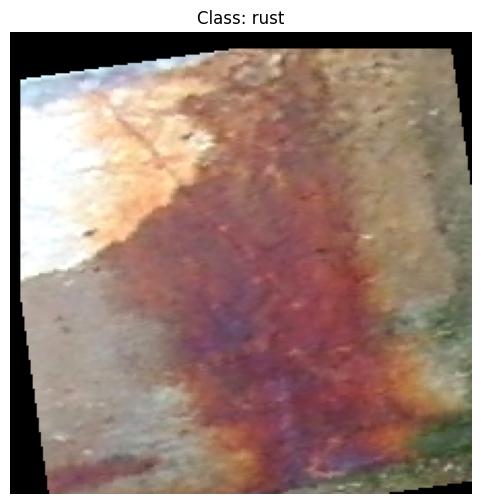

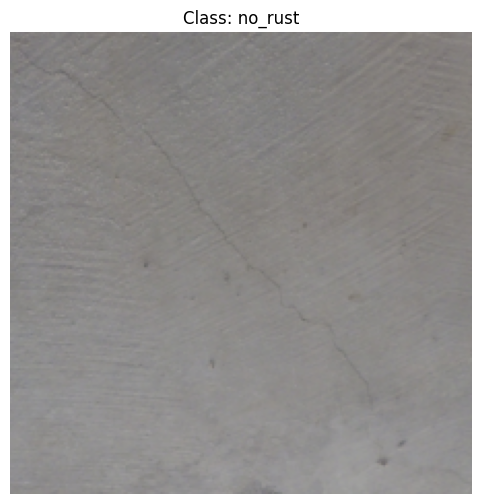

In [ ]:
%matplotlib inline

def visualize_image(dataset, classes=None):
    if len(dataset) == 0:
        print("The dataset is empty.")
        return

    # Randomly select an image and its label from the dataset
    img_idx = random.randint(0, len(dataset) - 1)
    img, label = dataset[img_idx]

    # Convert the image tensor back to a PIL image for display
    img = F.to_pil_image(img)

    # Get the class name from the dataset
    class_name = dataset.classes[label]

    # Plot the image
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.title(f"Class: {class_name}")
    plt.axis("off")
    plt.show()

visualize_image(train_data, classes=dataset.classes)
visualize_image(test_data, classes=dataset.classes)

In [ ]:
# allow access using GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 1. Simple CNN

In [ ]:
# define the CNN architecture
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=2):
        super(SimpleCNN, self).__init__()

        # Feature extraction layers
        self.features = nn.Sequential(
            # First Conv Layer: Input channels = 3 (RGB), Output channels = 32
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),  # Reduces spatial size by half

            # Second Conv Layer: Input channels = 32, Output channels = 64
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)   # Reduces spatial size by half
        )

        # Adaptive pooling to handle variable input sizes
        self.adaptive_pool = nn.AdaptiveAvgPool2d((7, 7))  # Output size can be adjusted

        # Classifier layers
        self.classifier = nn.Sequential(
            nn.Linear(64 * 7 * 7, 256),  # Adjusted based on adaptive pooling
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        # Pass input through feature extraction layers
        x = self.features(x)
        # Apply adaptive pooling
        x = self.adaptive_pool(x)
        # Flatten the tensor
        x = x.view(x.size(0), -1)
        # Pass through classifier
        x = self.classifier(x)
        return x

# initialize the CNN
model = SimpleCNN().to(device)
print(model)

SimpleCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (adaptive_pool): AdaptiveAvgPool2d(output_size=(7, 7))
  (classifier): Sequential(
    (0): Linear(in_features=3136, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.5, inplace=False)
    (4): Linear(in_features=256, out_features=512, bias=True)
    (5): BatchNorm1d(512, eps=1e-05, mome

In [ ]:
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer (adam: adaptive moment estimation) and learning rate = 0.01
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)

# specify scheduler for finding global optimal
scheduler = lr_scheduler.ReduceLROnPlateau(
        optimizer, "min", patience=2, factor=0.5
    )

In [ ]:
def train_one_epoch(
    model,
    train_loader,
    test_loader,
    device,
    optimizer,
    criterion
):
    # monitor training loss
    train_loss = 0.0
    valid_loss = 0.0
    all_labels = []
    all_preds = []

    model.train() # prep model for training
    for data, target in train_loader:
        # bring data and target to gpu
        data = data.to(device)
        target = target.to(device)
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        preds = torch.argmax(output, axis=1).cpu().detach().numpy()
        labels = target.cpu().numpy()
        # calculate the loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update running training loss
        train_loss += loss.item()*data.size(0)
        # calculate training metrics
        all_labels.extend(labels)
        all_preds.extend(preds)

    acc = accuracy_score(all_labels, all_preds)

    # validate-the-model
    model.eval()
    all_labels = []
    all_preds = []
    with torch.no_grad():
        for data, target in test_loader:
            data = data.type(torch.FloatTensor).to(device)
            target = target.to(device)
            output = model(data)
            preds = torch.argmax(output, axis=1).tolist()
            labels = target.tolist()
            all_labels.extend(labels)
            all_preds.extend(preds)
            loss = criterion(output, target)

            # update-average-validation-loss
            valid_loss += loss.item() * data.size(0)

    val_acc = accuracy_score(all_labels, all_preds)


    train_loss = train_loss / len(train_loader.dataset)
    valid_loss = valid_loss / len(test_loader.dataset)

    return (
        train_loss,
        valid_loss,
        acc,
        val_acc,
    )

In [ ]:
# number of epochs to train the model
n_epochs = 20
best_val_acc = 0

# initialize tracker for minimum validation loss
train_loss_min = np.Inf # set initial "min" to infinity

os.makedirs(f'{DATA_DIR}/models', exist_ok=True)

for epoch in tqdm(range(n_epochs)):
    train_loss, val_loss, train_result, val_result = train_one_epoch(
        model,
        train_loader,
        val_loader,
        device,
        optimizer,
        criterion,
    )

    scheduler.step(val_loss)

    print('Epoch: {} \tTraining Loss: {:.4f}\tTraining Accuracy: {:.4f}\nValidation Loss : {:.4f} \tValidation Accuracy: {:.4f}\n'.format(
        epoch+1,
        train_loss,
        train_result,
        val_loss,
        val_result
        ))

    # save model if validation loss has decreased
    if best_val_acc < float(val_result):
        print("Validation accuracy= " + str(val_result) + "===> Save best epoch")
        best_val_acc = val_result
        torch.save(model.state_dict(), f'{HOME_DIR}/models/best_simpleCNN.pt')
        train_loss_min = train_loss
    else:
        print("Validation accuracy= " + str(val_result) + "===> No saving")
        continue

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 	Training Loss: 0.7083	Training Accuracy: 0.5638
Validation Loss : 0.6737 	Validation Accuracy: 0.7234

Validation accuracy= 0.723404255319149===> Save best epoch


 10%|█         | 2/20 [00:09<01:22,  4.60s/it]

Epoch: 2 	Training Loss: 0.5176	Training Accuracy: 0.7447
Validation Loss : 0.6296 	Validation Accuracy: 0.7234

Validation accuracy= 0.723404255319149===> No saving


 15%|█▌        | 3/20 [00:12<01:08,  4.03s/it]

Epoch: 3 	Training Loss: 0.4378	Training Accuracy: 0.8032
Validation Loss : 0.5703 	Validation Accuracy: 0.7234

Validation accuracy= 0.723404255319149===> No saving


 20%|██        | 4/20 [00:15<00:59,  3.69s/it]

Epoch: 4 	Training Loss: 0.4335	Training Accuracy: 0.7872
Validation Loss : 0.5481 	Validation Accuracy: 0.7234

Validation accuracy= 0.723404255319149===> No saving


 25%|██▌       | 5/20 [00:19<00:52,  3.51s/it]

Epoch: 5 	Training Loss: 0.3441	Training Accuracy: 0.8617
Validation Loss : 0.5372 	Validation Accuracy: 0.7447

Validation accuracy= 0.7446808510638298===> Save best epoch


 30%|███       | 6/20 [00:23<00:52,  3.75s/it]

Epoch: 6 	Training Loss: 0.3127	Training Accuracy: 0.8617
Validation Loss : 0.5449 	Validation Accuracy: 0.8298

Validation accuracy= 0.8297872340425532===> Save best epoch


 35%|███▌      | 7/20 [00:26<00:46,  3.58s/it]

Epoch: 7 	Training Loss: 0.3172	Training Accuracy: 0.8564
Validation Loss : 0.5694 	Validation Accuracy: 0.7872

Validation accuracy= 0.7872340425531915===> No saving


 40%|████      | 8/20 [00:29<00:41,  3.46s/it]

Epoch: 8 	Training Loss: 0.3181	Training Accuracy: 0.8511
Validation Loss : 0.4912 	Validation Accuracy: 0.8085

Validation accuracy= 0.8085106382978723===> No saving


 45%|████▌     | 9/20 [00:32<00:37,  3.38s/it]

Epoch: 9 	Training Loss: 0.2633	Training Accuracy: 0.8830
Validation Loss : 0.4830 	Validation Accuracy: 0.8298

Validation accuracy= 0.8297872340425532===> No saving


 50%|█████     | 10/20 [00:37<00:36,  3.63s/it]

Epoch: 10 	Training Loss: 0.2358	Training Accuracy: 0.9149
Validation Loss : 0.5226 	Validation Accuracy: 0.8723

Validation accuracy= 0.8723404255319149===> Save best epoch


 55%|█████▌    | 11/20 [00:40<00:31,  3.51s/it]

Epoch: 11 	Training Loss: 0.2337	Training Accuracy: 0.9096
Validation Loss : 0.5897 	Validation Accuracy: 0.8085

Validation accuracy= 0.8085106382978723===> No saving


 60%|██████    | 12/20 [00:43<00:27,  3.41s/it]

Epoch: 12 	Training Loss: 0.2413	Training Accuracy: 0.8936
Validation Loss : 0.4670 	Validation Accuracy: 0.8085

Validation accuracy= 0.8085106382978723===> No saving


 65%|██████▌   | 13/20 [00:46<00:23,  3.35s/it]

Epoch: 13 	Training Loss: 0.2650	Training Accuracy: 0.9043
Validation Loss : 0.5272 	Validation Accuracy: 0.8298

Validation accuracy= 0.8297872340425532===> No saving


 70%|███████   | 14/20 [00:50<00:21,  3.60s/it]

Epoch: 14 	Training Loss: 0.2024	Training Accuracy: 0.9202
Validation Loss : 0.4491 	Validation Accuracy: 0.8511

Validation accuracy= 0.851063829787234===> No saving


 75%|███████▌  | 15/20 [00:54<00:17,  3.49s/it]

Epoch: 15 	Training Loss: 0.1951	Training Accuracy: 0.9362
Validation Loss : 0.4821 	Validation Accuracy: 0.8511

Validation accuracy= 0.851063829787234===> No saving


 80%|████████  | 16/20 [00:57<00:13,  3.42s/it]

Epoch: 16 	Training Loss: 0.2078	Training Accuracy: 0.9255
Validation Loss : 0.5146 	Validation Accuracy: 0.8085

Validation accuracy= 0.8085106382978723===> No saving


 85%|████████▌ | 17/20 [01:00<00:10,  3.40s/it]

Epoch: 17 	Training Loss: 0.2487	Training Accuracy: 0.9202
Validation Loss : 0.4598 	Validation Accuracy: 0.8511

Validation accuracy= 0.851063829787234===> No saving


 90%|█████████ | 18/20 [01:04<00:07,  3.59s/it]

Epoch: 18 	Training Loss: 0.1692	Training Accuracy: 0.9309
Validation Loss : 0.4310 	Validation Accuracy: 0.8723

Validation accuracy= 0.8723404255319149===> No saving


 95%|█████████▌| 19/20 [01:08<00:03,  3.50s/it]

Epoch: 19 	Training Loss: 0.1906	Training Accuracy: 0.9468
Validation Loss : 0.3989 	Validation Accuracy: 0.8511

Validation accuracy= 0.851063829787234===> No saving


100%|██████████| 20/20 [01:11<00:00,  3.56s/it]

Epoch: 20 	Training Loss: 0.1683	Training Accuracy: 0.9255
Validation Loss : 0.3250 	Validation Accuracy: 0.8511

Validation accuracy= 0.851063829787234===> No saving


In [ ]:
model.load_state_dict(torch.load(f'{HOME_DIR}/models/best_simpleCNN.pt'))

<ipython-input-68-b155b8962c99>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f'{HOME_DIR}/models/best_simpleCNN.pt'))


<All keys matched successfully>

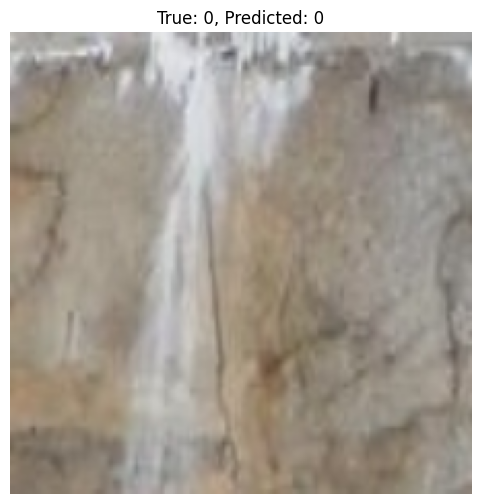

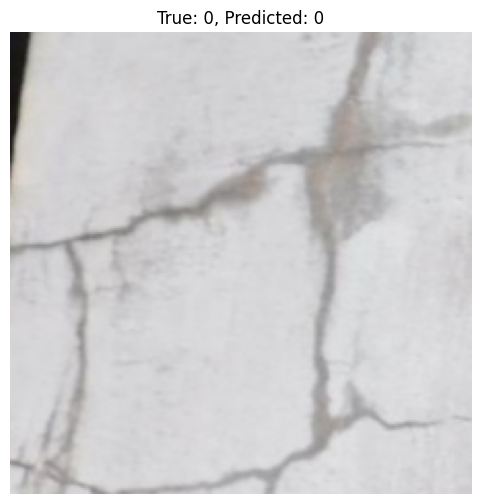

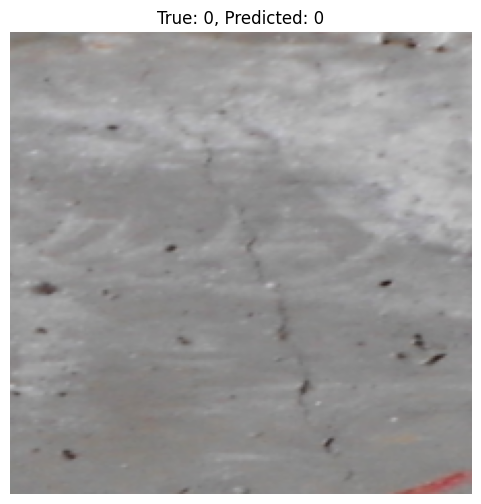

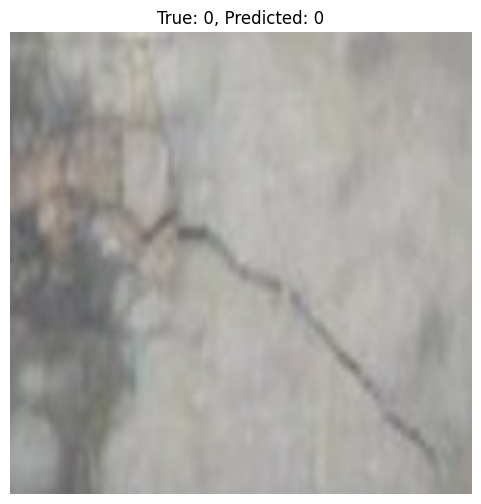

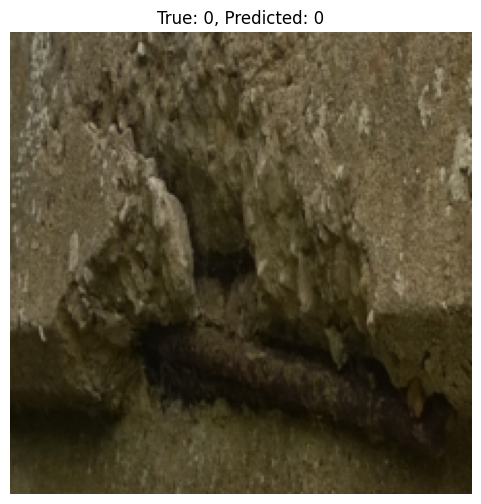

...

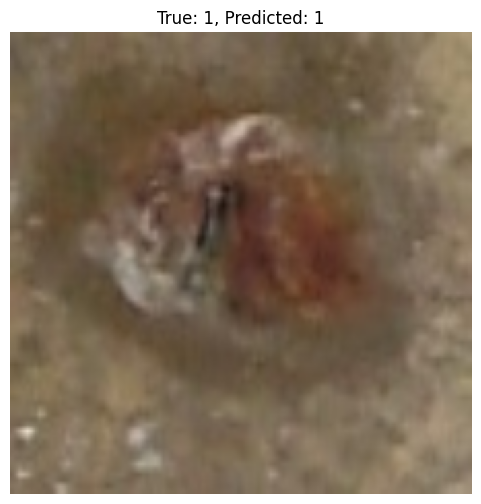

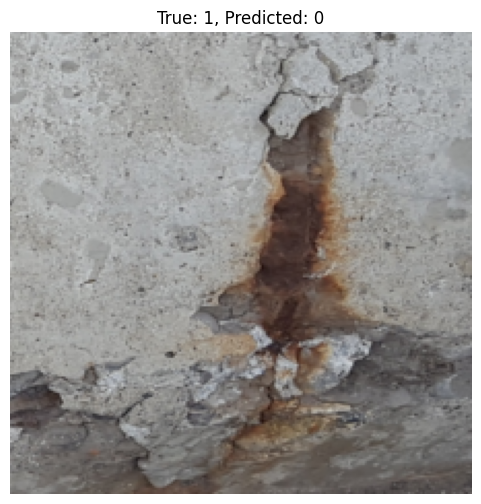

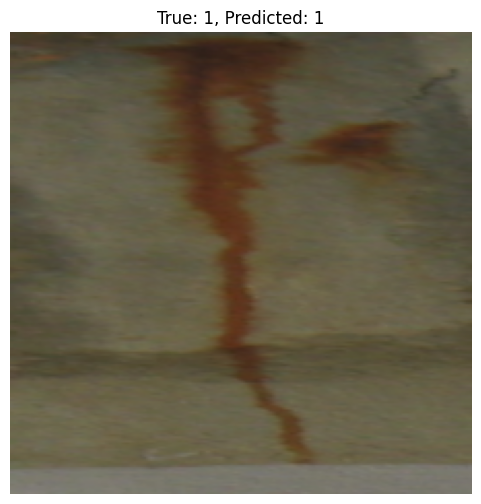

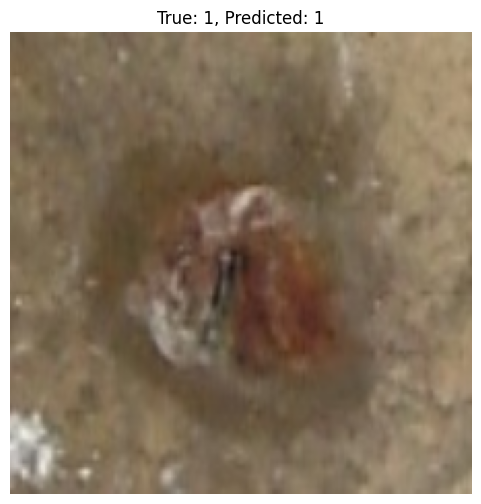

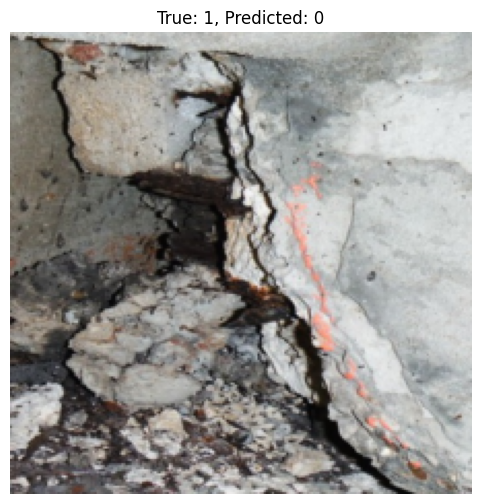

Accuracy on the 20 test images: 85.00%


In [ ]:
def model_eval(model, save_path, test_loader):
    model.eval()
    correct = 0
    total = 0
    results = []

    with torch.no_grad():
        for i, (images, labels) in enumerate(test_loader):
            outputs = model(images.to(device))
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels.to(device)).sum().item()

            # Save and visualize each test image with prediction
            for j in range(images.size(0)):
                true_class = labels[j].item()
                predicted_class = predicted[j].item()

                image_path = os.path.join(save_path, f"image_{i}_{j}_true_{true_class}_pred_{predicted_class}.png")
                save_image(images[j], image_path)

                # Add the result to the results list for creating a table
                results.append({"True Class": true_class, "Predicted Class": predicted_class})

                # Visualize the image
                plt.figure(figsize=(6, 6))
                plt.imshow(images[j].cpu().permute(1, 2, 0))
                plt.title(f"True: {true_class}, Predicted: {predicted_class}")
                plt.axis('off')
                plt.show()

    return correct, total, results

# Create output folder
save_path = '/content/drive/MyDrive/COS40007/Portfolio4/Results/cnn_test'
os.makedirs(save_path, exist_ok=True)

correct, total, results = model_eval(model, save_path, test_loader)
print(f"Accuracy on the {total} test images: {100 * correct / total:.2f}%")

In [ ]:
# Create a Pandas DataFrame for the results
df = pd.DataFrame(results)

# Save the table as a CSV file
df.to_csv('/content/drive/MyDrive/COS40007/Portfolio4/Results/result_simplecnn.csv', index=False)

# Display the table of results
print("The results have been successfully stored in Results")

The results have been successfully stored in Results


## 2. Transfer Learning: ResNet50

In [ ]:
# define the CNN architecture using pretrained ResNet50
class ResNet50CNN(nn.Module):
    def __init__(self, num_classes=2):
        super(ResNet50CNN, self).__init__()
        # Load pretrained ResNet50 model
        self.resnet50 = models.resnet50(pretrained=True)
        # Replace the final fully connected layer
        num_ftrs = self.resnet50.fc.in_features
        self.resnet50.fc = nn.Sequential(
            nn.Linear(num_ftrs, num_classes)
        )

    def forward(self, x):
        x = self.resnet50(x)
        return x

# initialize the CNN
model_resnet = ResNet50CNN().to(device)
print(model_resnet)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet50CNN(
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

In [ ]:
n_epochs = 20
best_val_acc = 0
train_loss_min = np.Inf

for epoch in tqdm(range(n_epochs)):
    train_loss, val_loss, train_result, val_result = train_one_epoch(
        model_resnet,
        train_loader,
        val_loader,
        device,
        optimizer,
        criterion,
    )

    scheduler.step(val_loss)
    print('Epoch: {} \tTraining Loss: {:.4f}\tTraining Accuracy: {:.4f}\nValidation Loss : {:.4f} \tValidation Accuracy: {:.4f}\n'.format(
        epoch + 1,
        train_loss,
        train_result,
        val_loss,
        val_result
    ))

    if best_val_acc < float(val_result):
        print("Validation accuracy= " + str(val_result) + "===> Save best epoch")
        best_val_acc = val_result
        torch.save(model_resnet.state_dict(), f'{HOME_DIR}/models/best_resnet50.pt')
        train_loss_min = train_loss
    else:
        print("Validation accuracy= " + str(val_result) + "===> No saving")
        continue

model_resnet.load_state_dict(torch.load(f'{HOME_DIR}/models/best_resnet50.pt'))

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 	Training Loss: 0.7017	Training Accuracy: 0.5372
Validation Loss : 0.7119 	Validation Accuracy: 0.4681

Validation accuracy= 0.46808510638297873===> Save best epoch


 10%|█         | 2/20 [00:10<01:37,  5.43s/it]

Epoch: 2 	Training Loss: 0.6998	Training Accuracy: 0.5319
Validation Loss : 0.7157 	Validation Accuracy: 0.4681

Validation accuracy= 0.46808510638297873===> No saving


 15%|█▌        | 3/20 [00:16<01:35,  5.59s/it]

Epoch: 3 	Training Loss: 0.6898	Training Accuracy: 0.5532
Validation Loss : 0.7447 	Validation Accuracy: 0.4043

Validation accuracy= 0.40425531914893614===> No saving
Epoch: 4 	Training Loss: 0.7102	Training Accuracy: 0.4947
Validation Loss : 0.7053 	Validation Accuracy: 0.4894

Validation accuracy= 0.48936170212765956===> Save best epoch


 20%|██        | 4/20 [00:21<01:26,  5.41s/it]

Epoch: 5 	Training Loss: 0.7071	Training Accuracy: 0.5266
Validation Loss : 0.6991 	Validation Accuracy: 0.5957

Validation accuracy= 0.5957446808510638===> Save best epoch


 30%|███       | 6/20 [00:33<01:17,  5.51s/it]

Epoch: 6 	Training Loss: 0.6947	Training Accuracy: 0.5479
Validation Loss : 0.6858 	Validation Accuracy: 0.5745

Validation accuracy= 0.574468085106383===> No saving
Epoch: 7 	Training Loss: 0.6898	Training Accuracy: 0.5213
Validation Loss : 0.6906 	Validation Accuracy: 0.6596

Validation accuracy= 0.6595744680851063===> Save best epoch


 40%|████      | 8/20 [00:45<01:12,  6.07s/it]

Epoch: 8 	Training Loss: 0.7007	Training Accuracy: 0.5266
Validation Loss : 0.6860 	Validation Accuracy: 0.5319

Validation accuracy= 0.5319148936170213===> No saving


 45%|████▌     | 9/20 [00:51<01:03,  5.77s/it]

Epoch: 9 	Training Loss: 0.7080	Training Accuracy: 0.5000
Validation Loss : 0.7108 	Validation Accuracy: 0.5319

Validation accuracy= 0.5319148936170213===> No saving


 50%|█████     | 10/20 [00:56<00:58,  5.81s/it]

Epoch: 10 	Training Loss: 0.6982	Training Accuracy: 0.5106
Validation Loss : 0.7163 	Validation Accuracy: 0.5106

Validation accuracy= 0.5106382978723404===> No saving


 55%|█████▌    | 11/20 [01:01<00:49,  5.52s/it]

Epoch: 11 	Training Loss: 0.7174	Training Accuracy: 0.5319
Validation Loss : 0.7046 	Validation Accuracy: 0.4894

Validation accuracy= 0.48936170212765956===> No saving


 60%|██████    | 12/20 [01:07<00:45,  5.69s/it]

Epoch: 12 	Training Loss: 0.6938	Training Accuracy: 0.5372
Validation Loss : 0.7184 	Validation Accuracy: 0.4894

Validation accuracy= 0.48936170212765956===> No saving


 65%|██████▌   | 13/20 [01:13<00:39,  5.65s/it]

Epoch: 13 	Training Loss: 0.6837	Training Accuracy: 0.5319
Validation Loss : 0.7104 	Validation Accuracy: 0.4468

Validation accuracy= 0.44680851063829785===> No saving


 70%|███████   | 14/20 [01:18<00:32,  5.39s/it]

Epoch: 14 	Training Loss: 0.6944	Training Accuracy: 0.5426
Validation Loss : 0.6988 	Validation Accuracy: 0.4894

Validation accuracy= 0.48936170212765956===> No saving


 75%|███████▌  | 15/20 [01:23<00:27,  5.44s/it]

Epoch: 15 	Training Loss: 0.6957	Training Accuracy: 0.5319
Validation Loss : 0.6886 	Validation Accuracy: 0.5319

Validation accuracy= 0.5319148936170213===> No saving


 80%|████████  | 16/20 [01:28<00:21,  5.33s/it]

Epoch: 16 	Training Loss: 0.7028	Training Accuracy: 0.5160
Validation Loss : 0.6943 	Validation Accuracy: 0.5319

Validation accuracy= 0.5319148936170213===> No saving


 85%|████████▌ | 17/20 [01:33<00:15,  5.17s/it]

Epoch: 17 	Training Loss: 0.6944	Training Accuracy: 0.5745
Validation Loss : 0.6817 	Validation Accuracy: 0.5319

Validation accuracy= 0.5319148936170213===> No saving


 90%|█████████ | 18/20 [01:39<00:10,  5.29s/it]

Epoch: 18 	Training Loss: 0.7082	Training Accuracy: 0.5053
Validation Loss : 0.6816 	Validation Accuracy: 0.6383

Validation accuracy= 0.6382978723404256===> No saving


 95%|█████████▌| 19/20 [01:44<00:05,  5.14s/it]

Epoch: 19 	Training Loss: 0.6966	Training Accuracy: 0.5160
Validation Loss : 0.6764 	Validation Accuracy: 0.5745

Validation accuracy= 0.574468085106383===> No saving


100%|██████████| 20/20 [01:49<00:00,  5.46s/it]

Epoch: 20 	Training Loss: 0.6959	Training Accuracy: 0.5000
Validation Loss : 0.6782 	Validation Accuracy: 0.6170

Validation accuracy= 0.6170212765957447===> No saving



<ipython-input-72-9517ca52855a>:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_resnet.load_state_dict(torch.load(f'{HOME_DIR}/models/best_resnet50.pt'))


<All keys matched successfully>

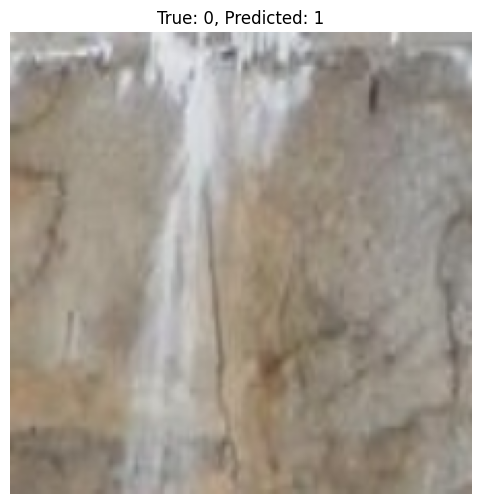

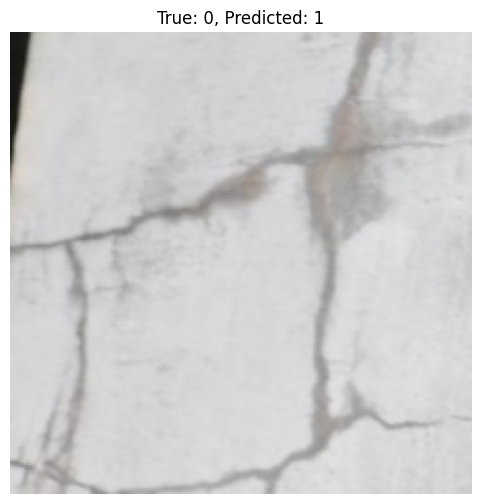

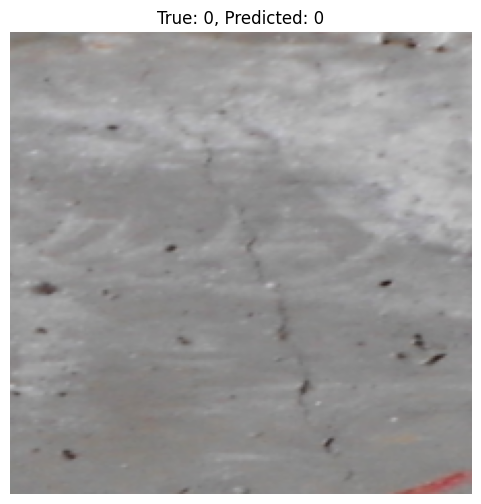

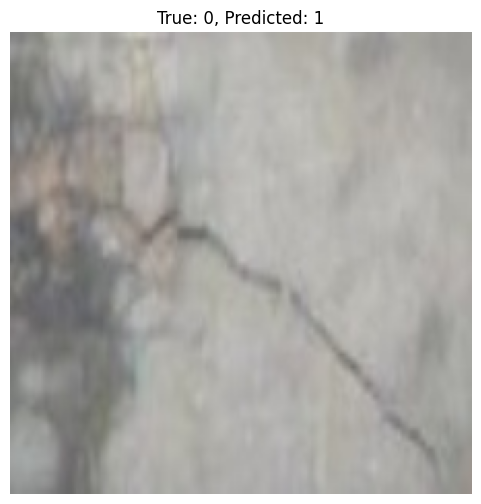

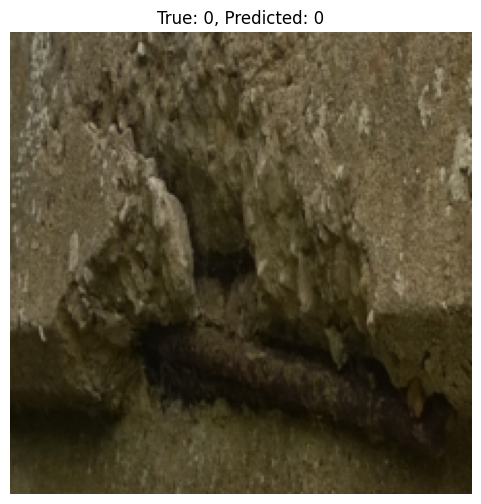

...

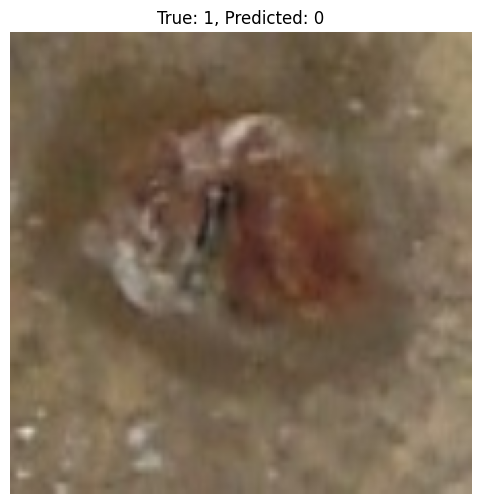

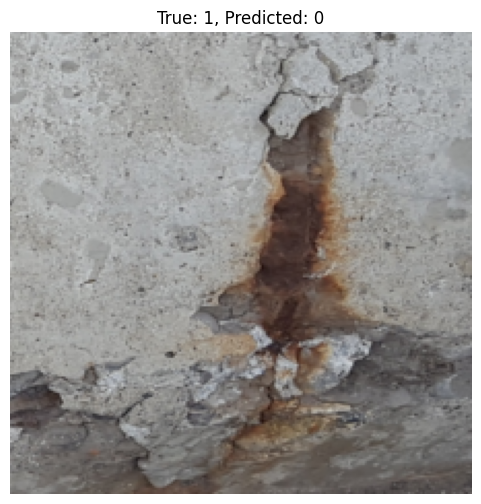

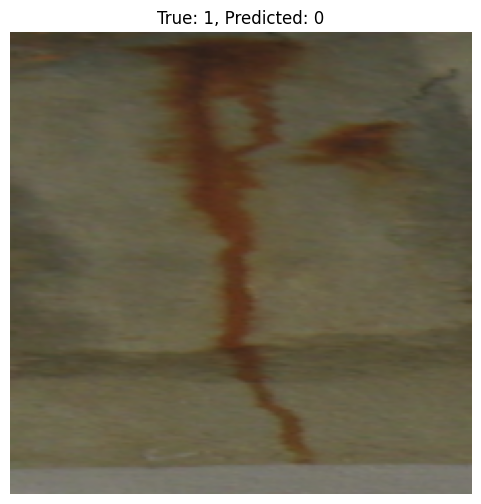

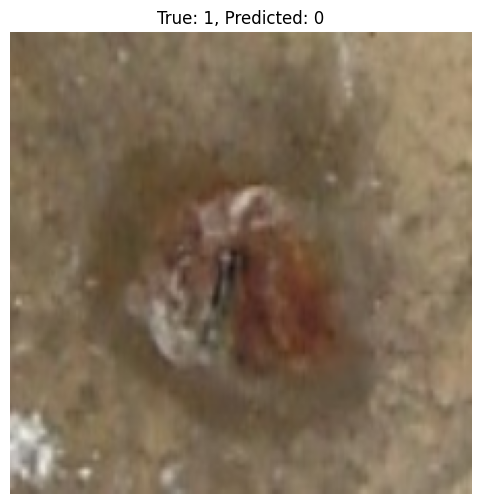

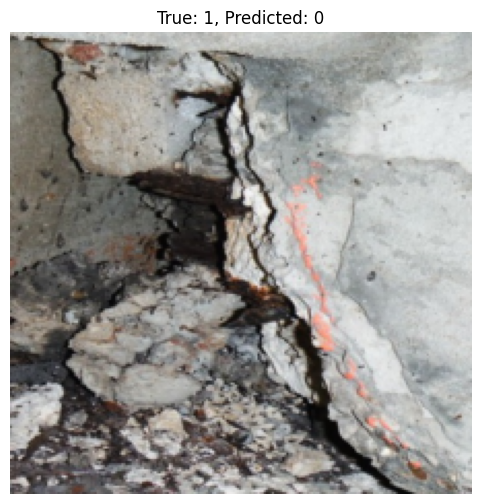

Accuracy on the 20 test images: 35.00%


In [ ]:
save_path = '/content/drive/MyDrive/COS40007/Portfolio4/Results/resnet50_test'
os.makedirs(save_path, exist_ok=True)
correct, total, results = model_eval(model_resnet, save_path, test_loader)
print(f"Accuracy on the {total} test images: {100 * correct / total:.2f}%")

In [ ]:
df = pd.DataFrame(results)
df.to_csv('/content/drive/MyDrive/COS40007/Portfolio4/Results/result_resnet50.csv', index=False)
print("The results have been successfully stored in Results")

The results have been successfully stored in Results
